In [ ]:
import scanpy as sc
import scvelo as scv
import numpy as np
import gtvelo as gtv  
import scipy.sparse as sparse
import torch as th
adata=sc.read_h5ad(r"D:\code\mine\notebook\fig2 pancreas\data\endocrinogenesis_day15.h5ad")
scv.pp.filter_genes(adata, min_shared_counts=20)
adata = gtv.utils.standard_clean_recipe(adata, celltype_key='clusters')
model = gtv.models.VAE(observed=2000, latent_dim=30, encoder_hidden=35, zr_dim=2, h_dim=3)

# Initialize the VAE model
The parameter settings for zr_dim and h_dim are the same as latentvelo.

In [ ]:
epochs, val_ae, val_traj = gtv.train(model, adata, batch_size = 100, learning_rate=1e-2,
                                     epochs=50, name='pancreas', grad_clip=100)

# Initialize the latent_adata and adata

In [ ]:
latent_adata, adata = gtv.output_results(model, adata, gene_velocity=True) 
scv.tl.velocity_embedding(latent_adata, vkey='spliced_velocity', basis='pca')
scv.tl.velocity_graph(adata, vkey='velo_s')
scv.tl.velocity_embedding(adata, vkey='velo_s', basis='pca')
scv.tl.velocity_graph(latent_adata, vkey='spliced_velocity')
latent_adata.write(r'D:\code\mine\GTvelo\2_adata_latentadata\pansreas_latent_adata2.h5ad')
adata.write(r'D:\code\mine\GTvelo\2_adata_latentadata\pansreasfins_adata2.h5ad')

# Or loading Pre-trained data

In [ ]:
latent_adata=sc.read_h5ad(r'D:\code\mine\GTvelo\2_adata_latentadata\pansreas_latent_adata2.h5ad')
adata=sc.read_h5ad(r'D:\code\mine\GTvelo\2_adata_latentadata\pansreasfins_adata2.h5ad')

computing velocity graph (using 1/28 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

    finished (0:00:02) --> added 
    'spliced_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'spliced_velocity_umap', embedded velocity vectors (adata.obsm)


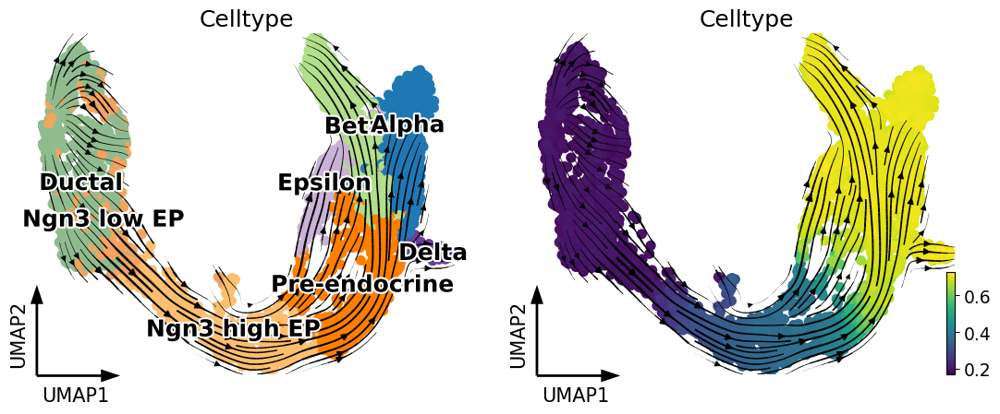

computing velocity embedding
    finished (0:00:02) --> added
    'spliced_velocity_pca', embedded velocity vectors (adata.obsm)
computing velocity graph (using 1/28 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

    finished (0:00:37) --> added 
    'velo_s_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:01) --> added
    'velo_s_pca', embedded velocity vectors (adata.obsm)


In [ ]:
scv.pl.velocity_embedding_stream(latent_adata,vkey='spliced_velocity', color=['clusters','latent_time'], 
                                 title='Celltype', alpha=1, 
                                 legend_fontsize=18, legend_fontoutline=3, fontsize=18, frameon='artist')

## FIG2 A B

In [ ]:
import scvelo as scv 
import scanpy as sc 
import gtvelo as gtv 


gt_adata=sc.read_h5ad(r'D:\code\mine\GTvelo\2_adata_latentadata\pansreasfins_latent_adata2.h5ad') 
la_adata = sc.read_h5ad(r"D:\code\mine\finish\gtvelo\lat_adata_latent\panfina_latent.h5ad")
sc_adata=sc.read_h5ad(r"D:\code\LatentVelo-main3\scvelo\pancreas.h5ad")
ae_adata=sc.read_h5ad(r"D:\code\VeloAE-main\HSS\adata\veloae_pancreas.h5ad")
custom_palette = [
    "#d73027",  # Gradient start: reddish
    "#fc8d59",  # Orange-red
    "#fee08b",  # Yellow-orange
    "#d9ef8b",  # Soft yellow-green
    "#91cf60",  # Green
    "#1a9850",  # Strong green
    "#66c2a5",  # Cyan
    "#3288bd",  # Blue-green
    "#5e4fa2"   # Gradient end: blue-purple
]


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file D:/重要文件/小论文/图片/fig2/Bunitvelo.png


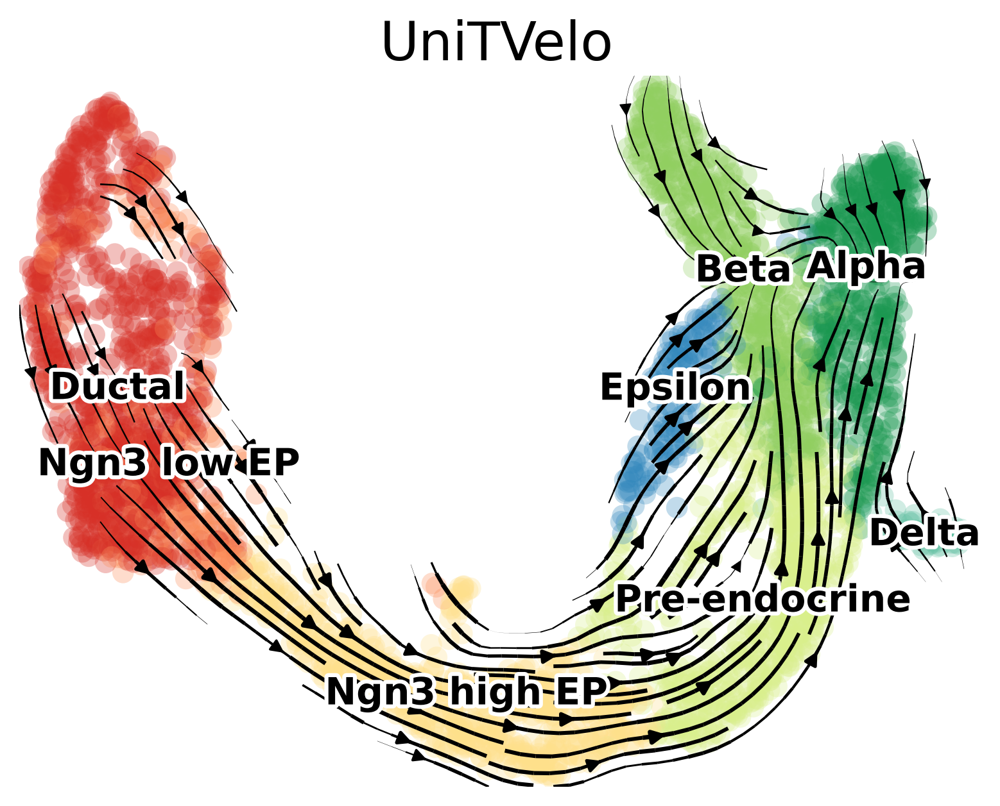

In [ ]:
import scvelo as scv 
import scanpy as sc 
import gtvelo as gtv 
sc_adata=sc.read_h5ad(r"D:\code\LatentVelo-main3\scvelo\pancreas.h5ad")
uni_adata=sc.read_h5ad(r"D:\code\mine\GTvelo2\unitvelo\uni_pan.h5ad")
uni_adata.obsm['X_umap'] = sc_adata.obsm['X_umap']
custom_palette = [
    "#d73027",  # Gradient start: reddish
    "#fc8d59",  # Orange-red
    "#fee08b",  # Yellow-orange
    "#d9ef8b",  # Soft yellow-green
    "#91cf60",  # Green
    "#1a9850",  # Strong green
    "#66c2a5",  # Cyan
    "#3288bd",  # Blue-green
    "#5e4fa2"   # Gradient end: blue-purple
]
scv.pl.velocity_embedding_stream(
    uni_adata,
    vkey='velocity',
    basis='umap',
    color=['clusters'],
    palette=custom_palette,  # Use the gradient palette
    dpi=300,
    title='UniTVelo',
    save='D:/重要文件/小论文/图片/fig2/Bunitvelo.png',
    legend_fontsize=14, 
    legend_fontoutline=3 ,
    fontsize=20 
)
 

saving figure to file D:/重要文件/小论文/图片/fig2/BGTVelo.png


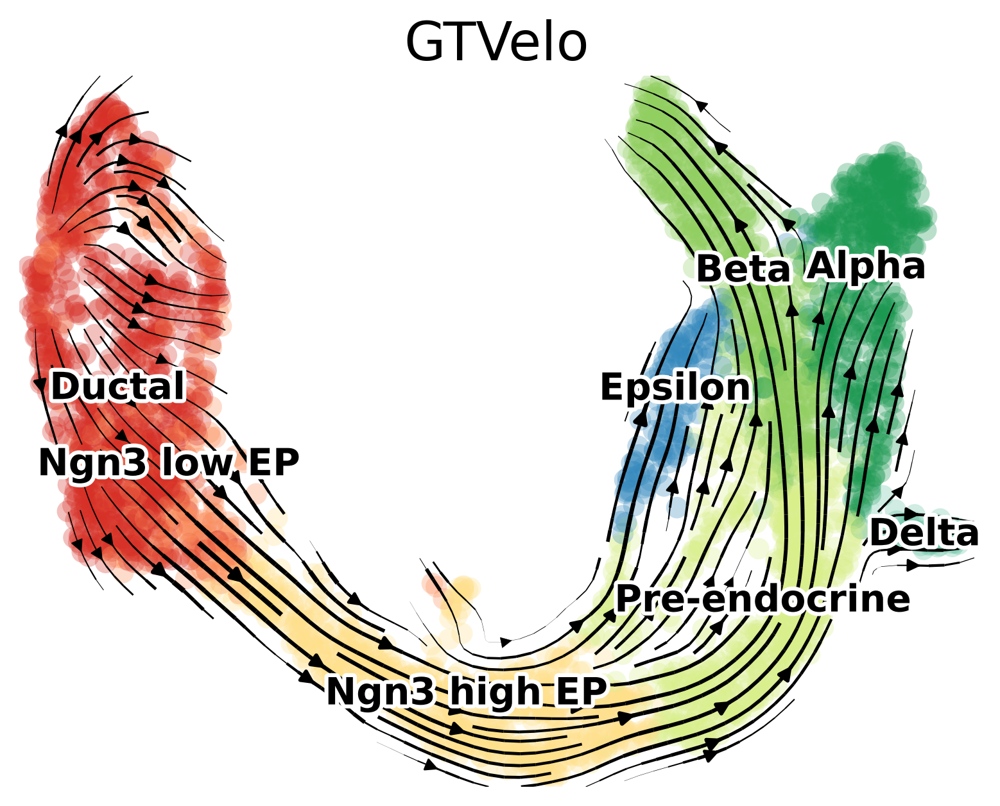

computing velocity embedding
    finished (0:00:00) --> added
    'spliced_velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file D:/重要文件/小论文/图片/fig2/ALatentVelo.png


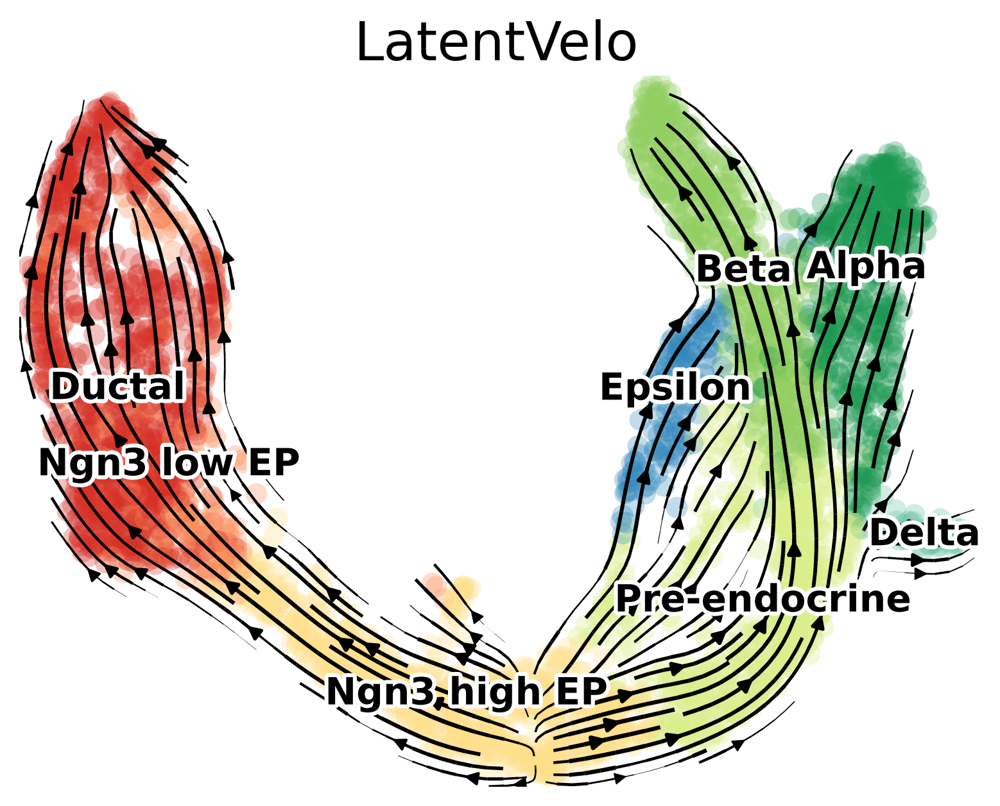

computing velocity embedding
    finished (0:00:01) --> added
    'dynvelo_umap', embedded velocity vectors (adata.obsm)
saving figure to file D:/重要文件/小论文/图片/fig2/Ascvelo_dyn.png


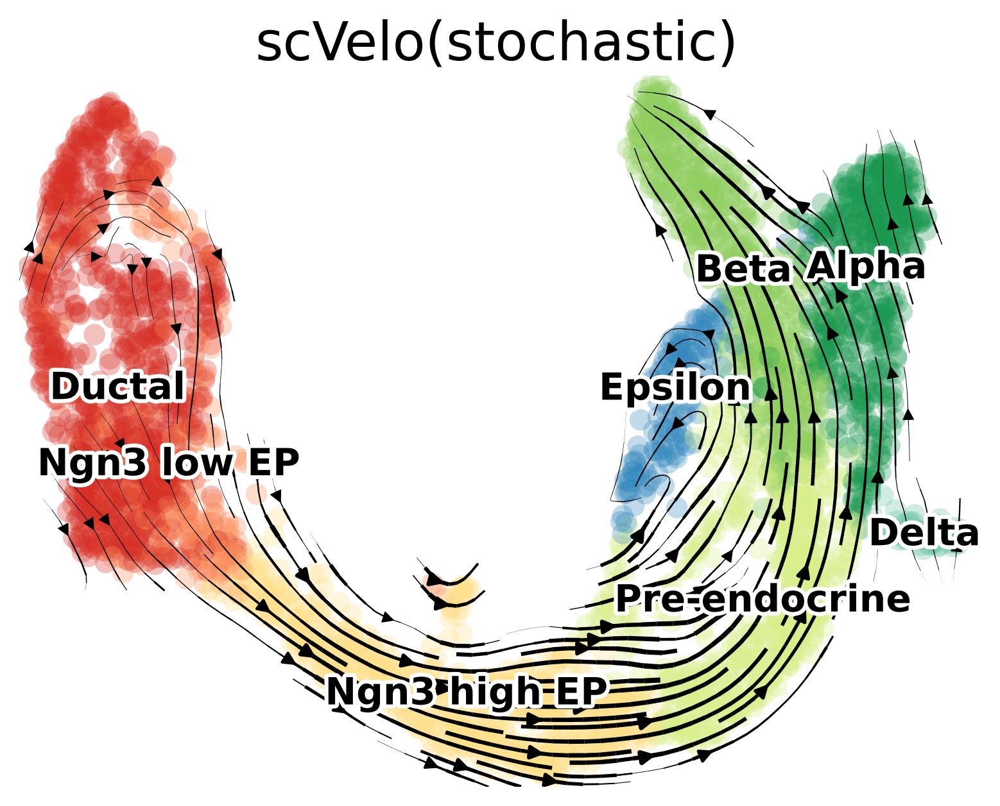

computing velocity embedding
    finished (0:00:00) --> added
    'stovelo_umap', embedded velocity vectors (adata.obsm)
saving figure to file D:/重要文件/小论文/图片/fig2/Ascvelo_sto.png


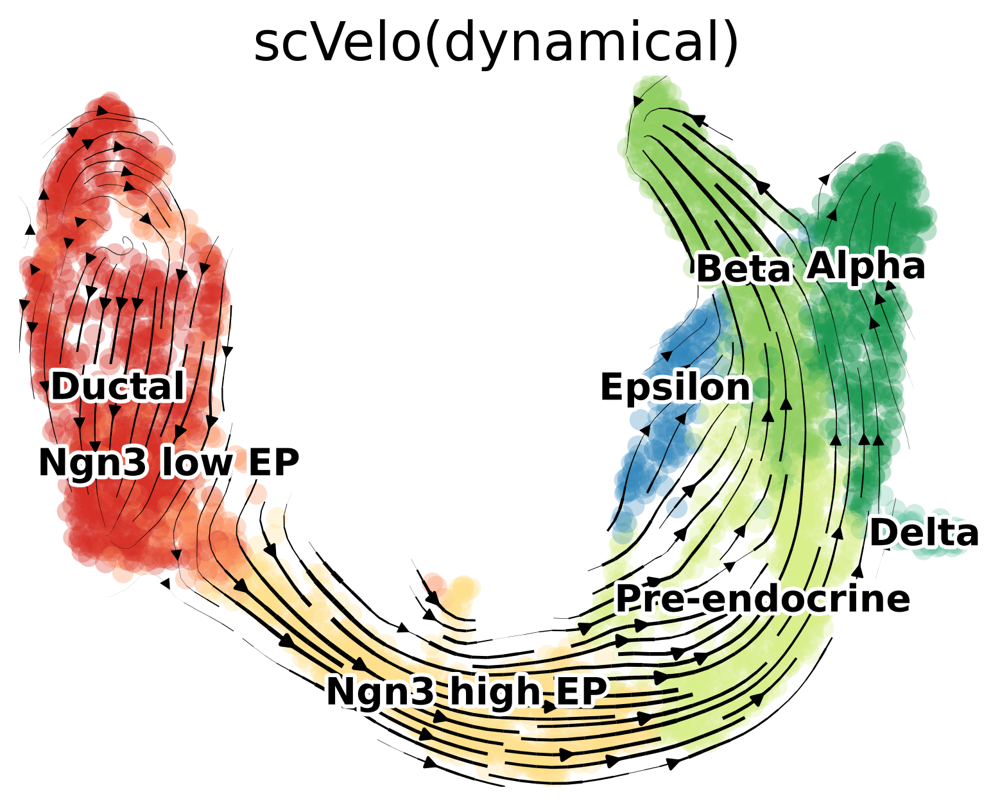

computing velocity embedding
    finished (0:00:02) --> added
    'new_velocity_pca', embedded velocity vectors (adata.obsm)
saving figure to file D:/重要文件/小论文/图片/fig2/AVeloAE.png


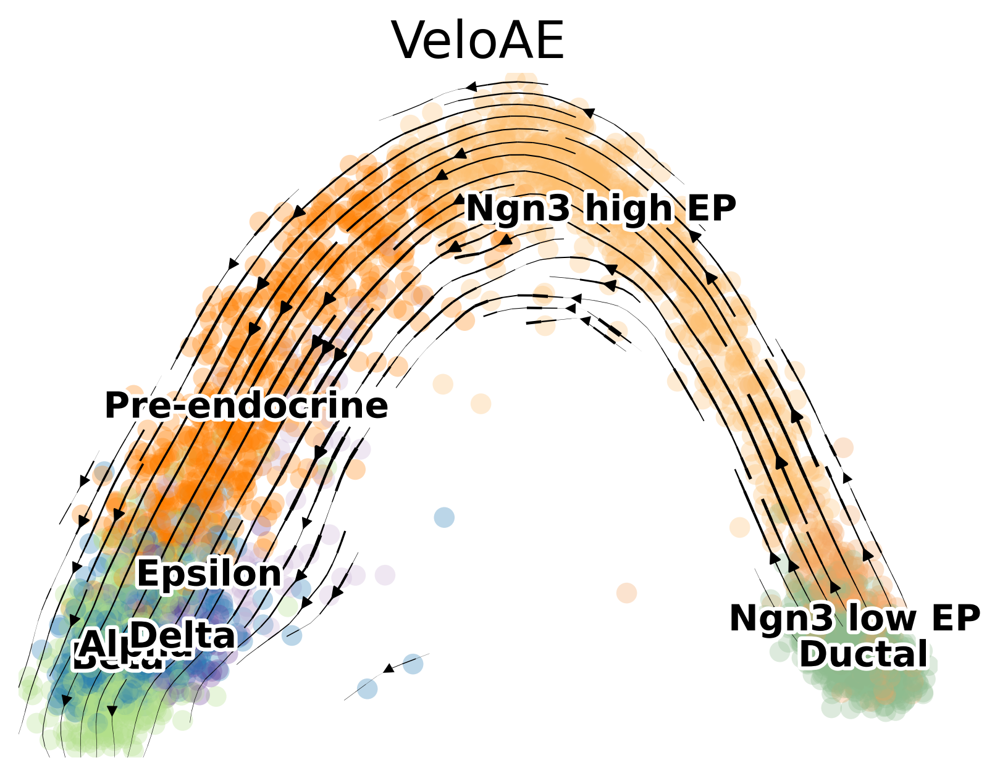

In [ ]:
scv.pl.velocity_embedding_stream(
    gt_adata,
    vkey='spliced_velocity',
    color=['clusters'],
    palette=custom_palette,  # Use the gradient palette
    dpi=300,
    title='GTVelo',
    save='D:/重要文件/小论文/图片/fig2/BGTVelo.png',
    legend_fontsize=14, 
    legend_fontoutline=3 ,
    fontsize=20 
)
 
scv.pl.velocity_embedding_stream(
    la_adata,
    vkey='spliced_velocity',
    color=['clusters'],
    palette=custom_palette,      
    dpi=300,
    title='LatentVelo',
    save='D:/重要文件/小论文/图片/fig2/ALatentVelo.png',
    legend_fontsize=14, 
    legend_fontoutline=3 ,
    fontsize=20 
)
scv.pl.velocity_embedding_stream(
    sc_adata,
    vkey='dynvelo',
    color=['clusters'],
    palette=custom_palette,  # Use the gradient palette
    dpi=300,
    title='scVelo(stochastic)',
    save='D:/重要文件/小论文/图片/fig2/Ascvelo_dyn.png',
    legend_fontsize=14, 
    legend_fontoutline=3 ,
    fontsize=20 
)
scv.pl.velocity_embedding_stream(
    sc_adata,
    vkey='stovelo',
    color=['clusters'],
    palette=custom_palette,  # Use the gradient palette
    dpi=300,
    title='scVelo(dynamical)',
    save='D:/重要文件/小论文/图片/fig2/Ascvelo_sto.png',
    legend_fontsize=14, 
    legend_fontoutline=3 ,
    fontsize=20 
)
scv.pl.velocity_embedding_stream(
    ae_adata,
    vkey='new_velocity',
    color=['clusters'],
    dpi=300,
    title='VeloAE',
    save='D:/重要文件/小论文/图片/fig2/AVeloAE.png',
    legend_fontsize=14, 
    legend_fontoutline=3 ,
    fontsize=20 
)


saving figure to file D:/重要文件/小论文/图片/fig2/AVeloAE.png


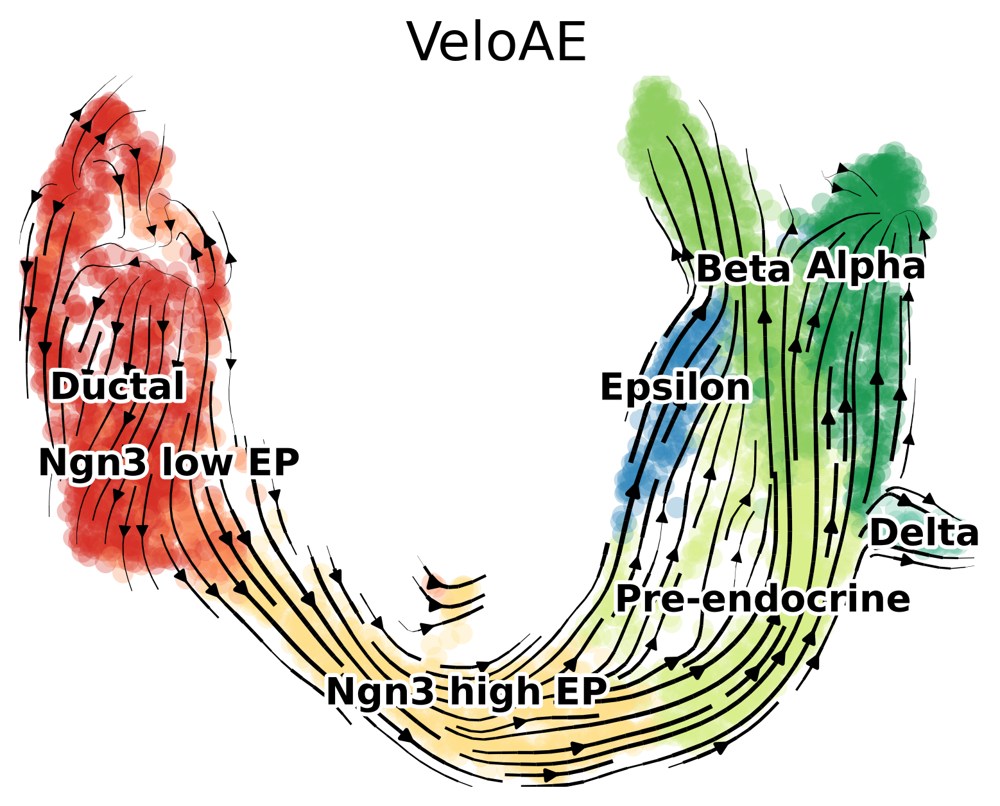

In [ ]:
ae_adata.obsm['X_umap'] = sc_adata.obsm['X_umap']
scv.pl.velocity_embedding_stream(
    ae_adata,
    palette=custom_palette,
    basis='umap',
    vkey='new_velocity',
    color=['clusters'],
    dpi=300,
    title='VeloAE',
    save='D:/重要文件/小论文/图片/fig2/AVeloAE.png',
    legend_fontsize=14, 
    legend_fontoutline=3 ,
    fontsize=20
)

## FIG2 C

saving figure to file D:/重要文件/小论文/图片/fig2/B_latnet_time.png


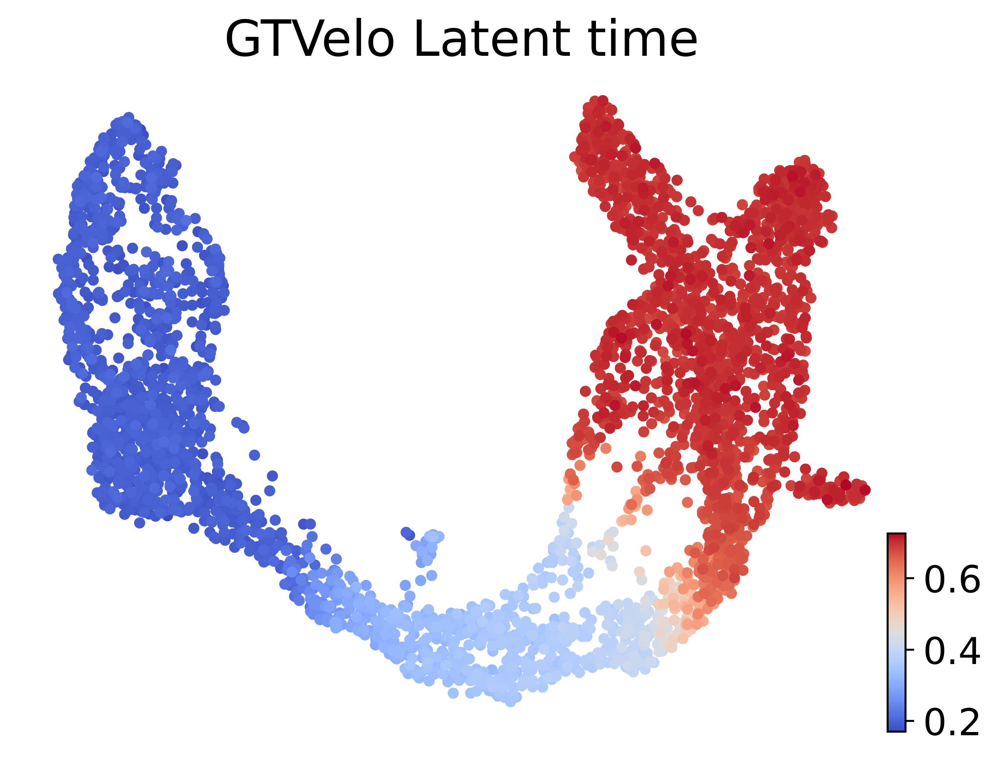

In [ ]:
scv.pl.scatter(gt_adata, color='latent_time', color_map='coolwarm', size=80, colorbar=True,title='GTVelo Latent time',fontsize=20,dpi=500,save='D:/重要文件/小论文/图片/fig2/B_latnet_time.png')

# FIG2 D

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
adata=  sc.read(r"D:\code\mine\GTvelo\2_adata_latentadata\pansreasfins_adata2.h5ad")
adata.obs['latent_time'] = adata.obs['latent_time'].astype(float)
adata = adata[adata.obs['latent_time'].argsort()]
high_likelihood_genes = adata.var.index[adata.var['velocity_genes']].tolist()[:300]
expression_data = adata[:, high_likelihood_genes].layers['spliced']
if hasattr(expression_data, "toarray"):
    expression_data = expression_data.toarray()
else:
    expression_data = np.array(expression_data)
expression_data = zscore(expression_data, axis=0)
expression_df = pd.DataFrame(expression_data, columns=high_likelihood_genes, index=adata.obs['latent_time'])


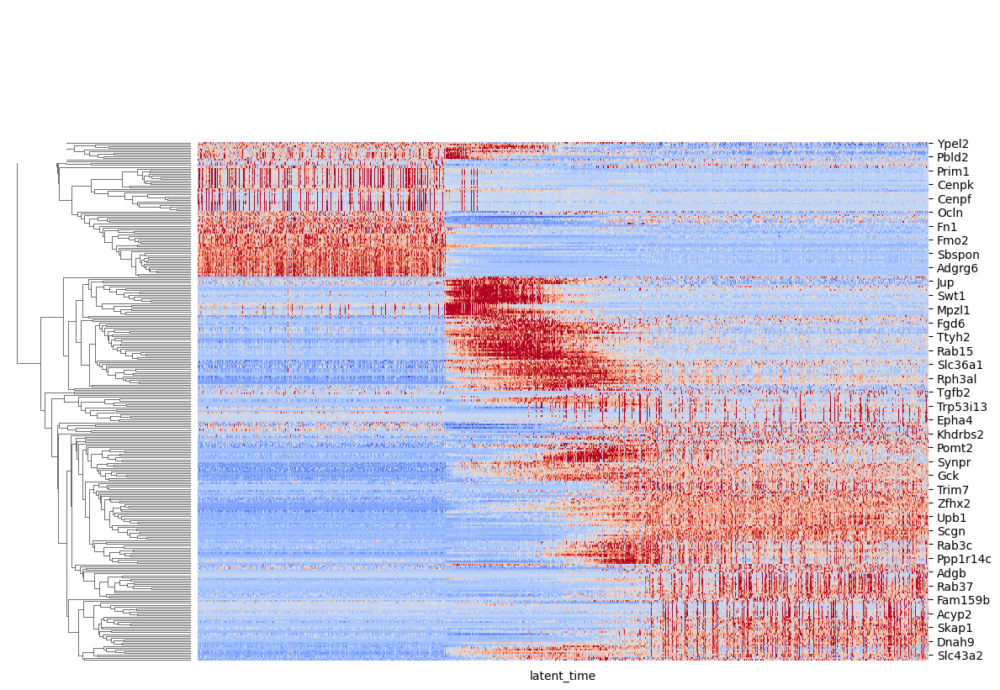

In [ ]:
g =sns.clustermap(
    expression_df.T, 
    cmap='coolwarm', 
    vmin=-2, vmax=2, 
    figsize=(12, 10), 
    cbar=False,  # 取消图例（color bar）
    row_cluster=True,  # 对基因进行聚类
    col_cluster=False)
    #dpi=500,
    #save='D:/重要文件/小论文/图片/fig2/C_latnet_time.png')  # 不对细胞进行聚类，保持潜伏时间顺序
#plt.title('Gene Expression Dynamics Along Latent Time', fontsize=16)

# 隐藏 x 轴的刻度
g.ax_heatmap.set_xticks([])

# 设置轴标签
#plt.xlabel('Latent Time', fontsize=12)
#plt.ylabel('High-likelihood Genes', fontsize=12)

plt.yticks([])
plt.xticks([])
#plt.xlabel('Latent Time')
#plt.ylabel('High-likelihood Genes')
#plt.title('Expression Dynamics of Top 300 Likelihood-ranked Genes Along Latent Time')
plt.savefig('D:/重要文件/小论文/图片/fig2/C_latnet_time.png', dpi=300)

plt.show()



# FIG2 E

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import uniform_filter1d

cluster1_genes = [
    "Fmo2", "Clmn", "Daam1", "Dtymk" 
]
cluster2_genes = ["Baz1a", "Prox1", "Flii", "Nbr1", "Fut8" ]
cluster3_genes = ["Rab36","Rnf130", "Tmx1", "Gng4"]
pseudotime = adata.obs['latent_time'].values
expression_data = adata.layers['spliced']
def get_cluster_mean_expression(genes):
    valid_genes = [gene for gene in genes if gene in adata.var_names]
    cluster_data = expression_data[:, [adata.var_names.get_loc(gene) for gene in valid_genes]]
    return cluster_data.mean(axis=1)

# 计算每个簇的平均表达值
cluster1_mean = get_cluster_mean_expression(cluster1_genes)
cluster2_mean = get_cluster_mean_expression(cluster2_genes)
cluster3_mean = get_cluster_mean_expression(cluster3_genes)
#cluster4_mean = get_cluster_mean_expression(cluster4_genes)

# 使用移动平均平滑表达数据
def smooth_data(data, window_size=10):
    return uniform_filter1d(data, size=window_size)

# 平滑后的簇表达曲线
cluster1_smooth = smooth_data(cluster1_mean, window_size=10)
cluster2_smooth = smooth_data(cluster2_mean, window_size=10)
cluster3_smooth = smooth_data(cluster3_mean, window_size=10)
#cluster4_smooth = smooth_data(cluster4_mean, window_size=10)


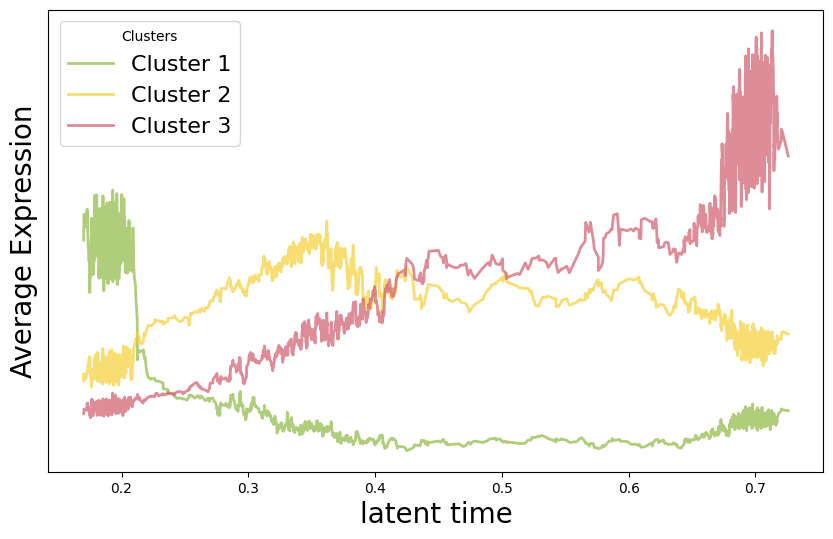

In [ ]:
["#CFE7EB", "white", "lightcoral"]
plt.figure(figsize=(10, 6))

plt.plot(pseudotime, cluster1_smooth, label='Cluster 1', color="#8FB943", linewidth=2, alpha=0.7)
plt.plot(pseudotime, cluster2_smooth, label='Cluster 2', color="#F5CF36", linewidth=2, alpha=0.7)
plt.plot(pseudotime, cluster3_smooth, label='Cluster 3', color="#D15C6B", linewidth=2, alpha=0.7)

# 配置图例和标题
plt.xlabel('latent time',fontsize=20 )
plt.ylabel('Average Expression',fontsize=20 )
#plt.title('Smoothed Expression Dynamics of Gene Clusters Along Pseudotime')
plt.legend(loc='upper left', title='Clusters',fontsize=16)
plt.yticks([])
plt.savefig('D:/重要文件/小论文/图片/fig2/E.png', dpi=600)

plt.show()


# FIG2 F

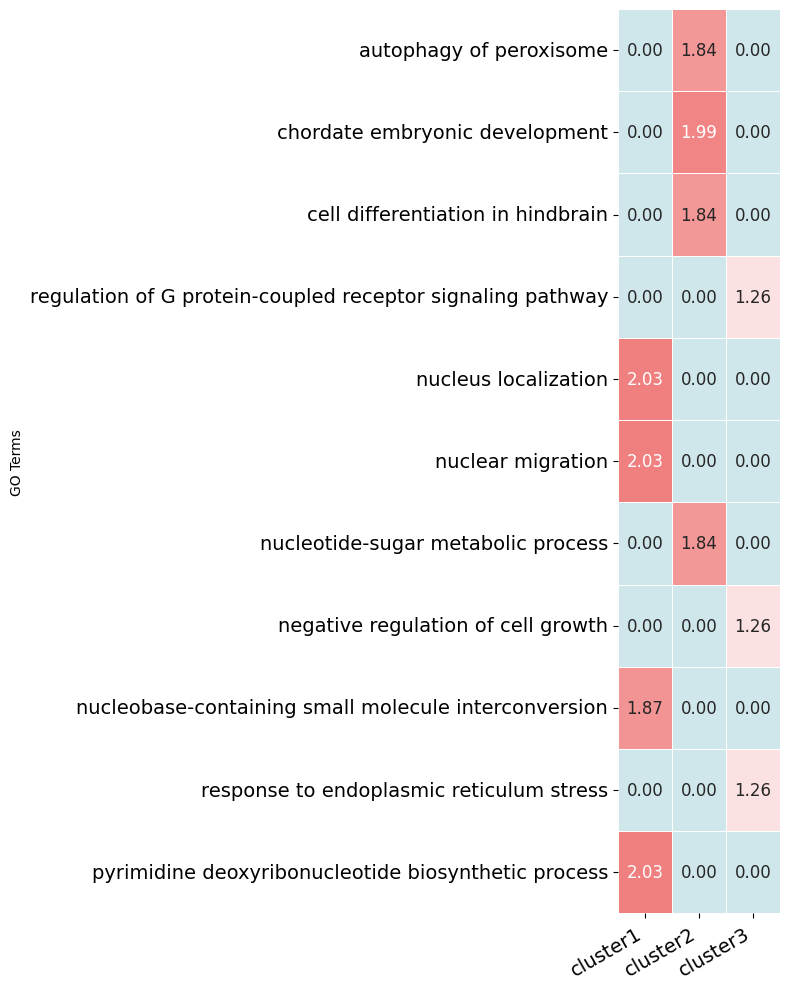

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
# Example data (replace with your own)
data = {
    "GO Terms": [
       # "negative regulation of growth",
        "autophagy of peroxisome",
        "chordate embryonic development",
        "cell differentiation in hindbrain",
        "regulation of G protein-coupled receptor signaling pathway",
        "nucleus localization",
        "nuclear migration",
        "nucleotide-sugar metabolic process",
        "negative regulation of cell growth",
        "nucleobase-containing small molecule interconversion",
        "response to endoplasmic reticulum stress",
        "pyrimidine deoxyribonucleotide biosynthetic process"
    ],
    "cluster1": [  0.00, 0.00, 0.00, 0.00, 2.03, 2.03, 0.00, 0.00, 1.87, 0.00, 2.03],
    "cluster2": [  1.84, 1.99, 1.84, 0.00, 0.00, 0.00, 1.84, 0.00, 0.00, 0.00, 0.00],
    "cluster3": [  0.00, 0.00, 0.00, 1.26, 0.00, 0.00, 0.00, 1.26, 0.00, 1.26, 0.00],
}
custom_cmap = LinearSegmentedColormap.from_list(
    "custom_cmap", ["#CFE7EB", "white", "lightcoral"]
)
# Create DataFrame
df = pd.DataFrame(data)
df = df.set_index("GO Terms")  # Set GO Terms as index

# Create heatmap
plt.figure(figsize=(8, 10))  # Adjust the figure size
ax = sns.heatmap(
    df,
    annot=True,               # Annotate with values
    fmt=".2f",                # Format annotations to 2 decimal places
    cmap=custom_cmap,              # Set colormap to 'Reds'
    linewidths=0.5,           # Add grid lines between cells
    cbar=False,               # Remove colorbar
    annot_kws={"size": 12}    # Increase the size of numbers inside cells
)

# Add title and labels
#plt.title("GO Enrichment Across Clusters", fontsize=16, pad=20)
#plt.xlabel("Clusters", fontsize=12)

# Increase y-axis font size
labels = ax.get_yticklabels()
ax.set_yticklabels(labels, fontsize=14)
# 旋转 x 轴文字
ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=14)

# Show plot
plt.tight_layout()
plt.savefig('D:/重要文件/小论文/图片/fig2/F.png', dpi=600)

plt.show()



# FIG2 G

saving figure to file D:/重要文件/小论文/图片/fig2/G_Daam1.png


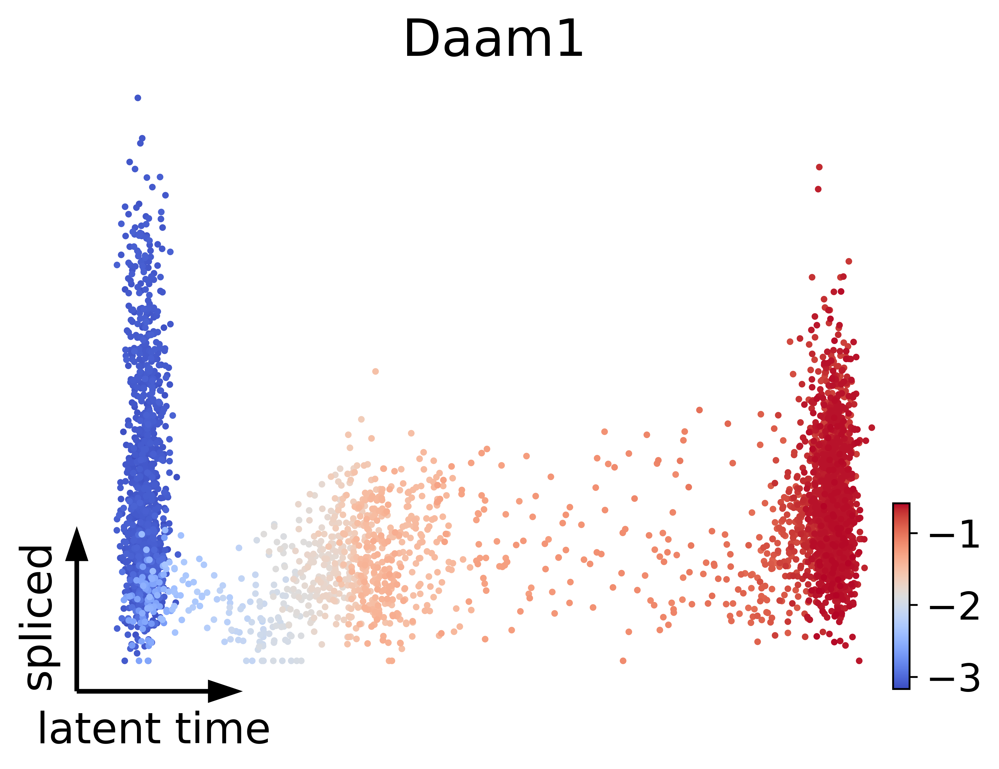

saving figure to file D:/重要文件/小论文/图片/fig2/G_Prox1.png


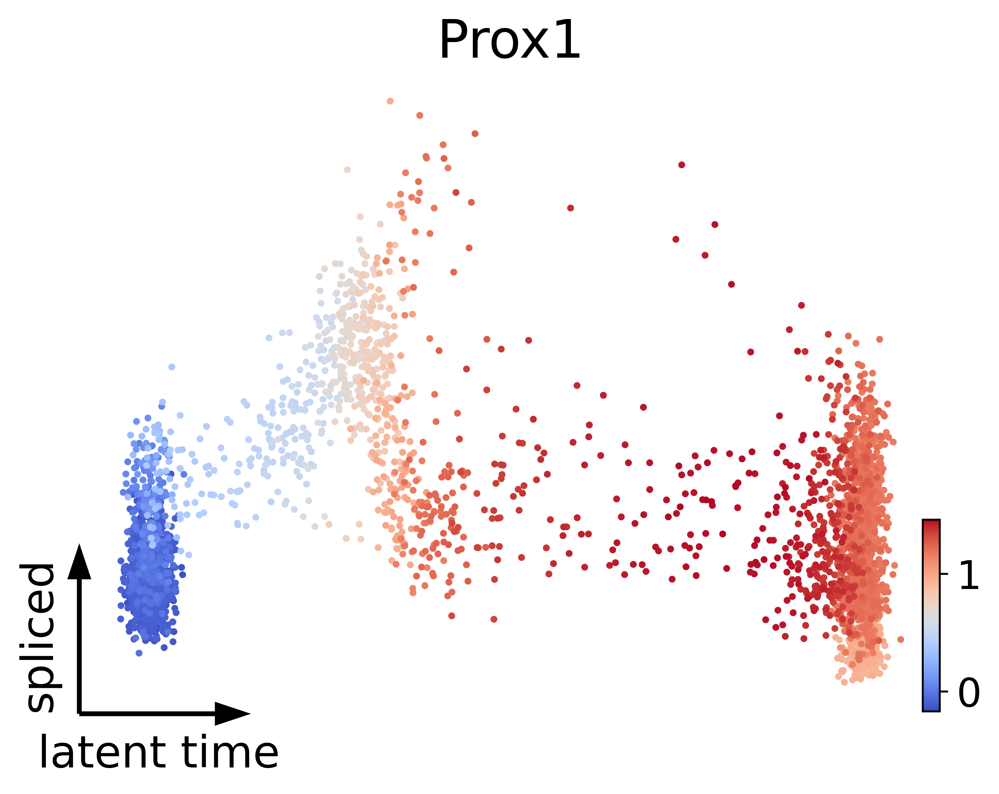

saving figure to file D:/重要文件/小论文/图片/fig2/G_Gng4.png


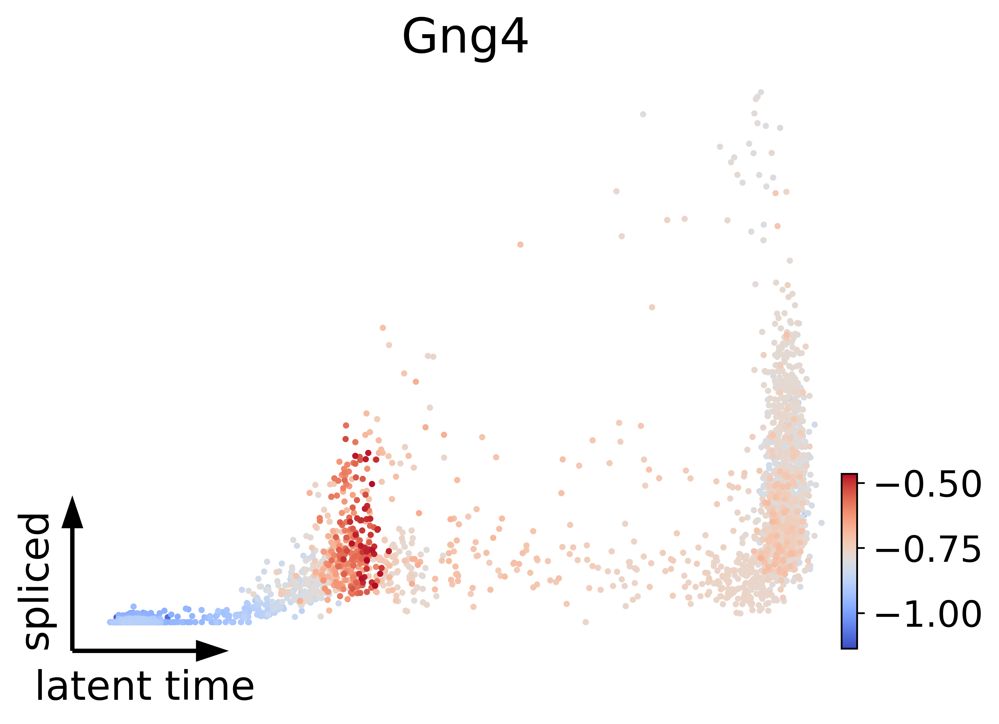

saving figure to file D:/重要文件/小论文/图片/fig2/G_Baz1a.png


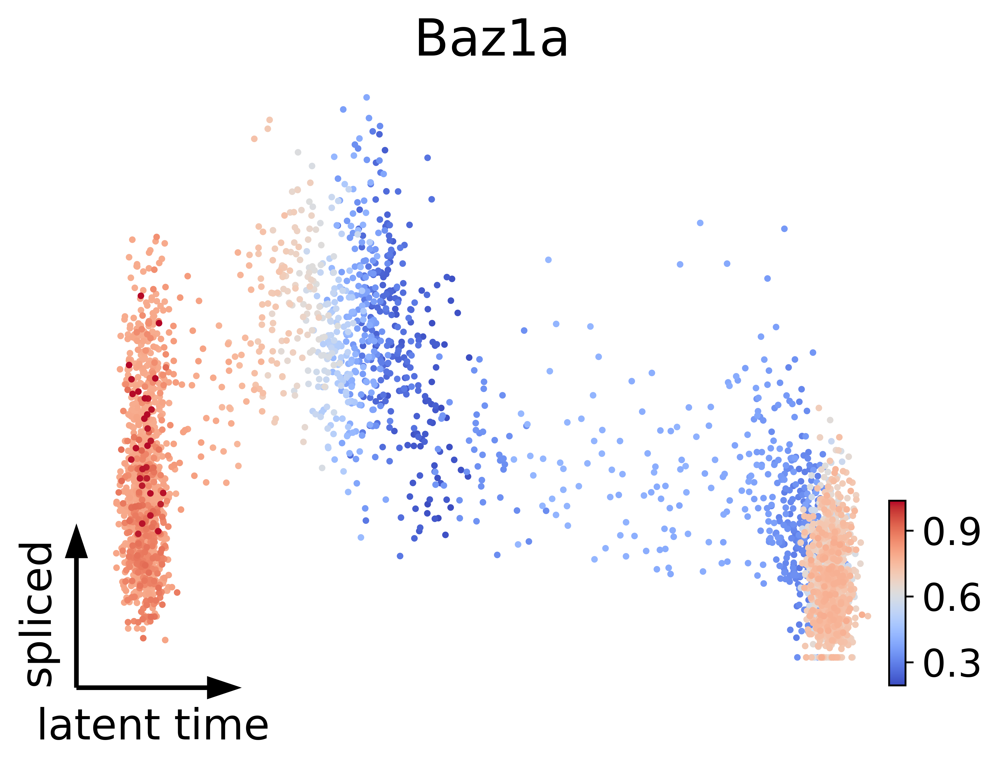

In [ ]:
adata.obs['Daam1_direction'] = adata[:,adata.var.index.values=='Daam1'].layers['velo'][:,0]
adata.obs['Prox1_direction'] = adata[:,adata.var.index.values=='Prox1'].layers['velo'][:,0]
adata.obs['Gng4_direction'] = adata[:,adata.var.index.values=='Gng4'].layers['velo'][:,0]
adata.obs['Baz1a_direction'] = adata[:,adata.var.index.values=='Baz1a'].layers['velo'][:,0]
scv.pl.scatter(
    adata, x='latent_time', y='Daam1', color='Daam1_direction', color_map='coolwarm',
    title='Daam1', frameon='artist', fontsize=22, legend_loc=None, save='D:/重要文件/小论文/图片/fig2/G_Daam1.png', dpi=600
)

scv.pl.scatter(
    adata, x='latent_time', y='Prox1', color='Prox1_direction', color_map='coolwarm',
    title='Prox1', frameon='artist', fontsize=22, legend_loc=None, save='D:/重要文件/小论文/图片/fig2/G_Prox1.png', dpi=600
)

scv.pl.scatter(
    adata, x='latent_time', y='Gng4', color='Gng4_direction', color_map='coolwarm',
    title='Gng4', frameon='artist', fontsize=22, legend_loc=None, save='D:/重要文件/小论文/图片/fig2/G_Gng4.png', dpi=600
)

scv.pl.scatter(
    adata, x='latent_time', y='Baz1a', color='Baz1a_direction', color_map='coolwarm',
    title='Baz1a', frameon='artist', fontsize=22, legend_loc=None, save='D:/重要文件/小论文/图片/fig2/G_Baz1a.png', dpi=600
)


saving figure to file D:/重要文件/小论文/图片/fig2/G_.png


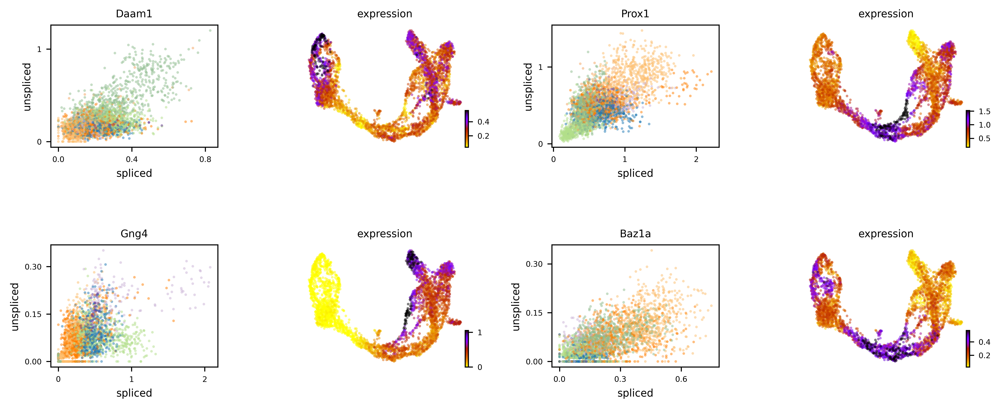

In [ ]:
 
var_names = [ 'Daam1', 'Prox1', 'Gng4','Baz1a']
scv.pl.velocity(adata, var_names=var_names, colorbar=True, ncols=2,save='D:/重要文件/小论文/图片/fig2/G_.png', dpi=600)

# benchmark

In [ ]:
import scvelo as scv 
import scanpy as sc 
import latentvelo as ltv
ae_bri_adata=sc.read_h5ad(r"D:\code\VeloAE-main\HSS\adata\veloae_b_s.h5ad")
ae_lin_adata=sc.read_h5ad(r"D:\code\VeloAE-main\HSS\adata\veloae_linear.h5ad")
ae_tri_adata=sc.read_h5ad(r"D:\code\VeloAE-main\HSS\adata\veloae_tri.h5ad")
ae_den_adata=sc.read_h5ad(r"D:\code\VeloAE-main\HSS\adata\veloae_den.h5ad")
ae_hind_adata=sc.read_h5ad(r"D:\code\VeloAE-main\HSS\adata\veloae_hindbrain_pons.h5ad")
ae_bon_adata=sc.read_h5ad(r"D:\code\VeloAE-main\HSS\adata\veloae_humanbone.h5ad")
ae_mouse_adata=sc.read_h5ad(r'D:\code\VeloAE-main\HSS\adata\veloae_mouse_ery.h5ad')#########
ae_pan_adata=sc.read_h5ad(r"D:\code\VeloAE-main\HSS\adata\veloae_pancreas.h5ad")
ae_sceu_adata=sc.read_h5ad(r'D:\code\VeloAE-main\HSS\adata\veloae_sceu.h5ad')#########
ae_scnt_adata=sc.read_h5ad(r"D:\code\VeloAE-main\HSS\adata\veloae_scnt.h5ad")
ae_bri2batch_adata=sc.read_h5ad(r"D:\code\VeloAE-main\HSS\adata\veloae_brif_2batches.h5ad")
ae_konbatch_adata=sc.read_h5ad(r"D:\code\VeloAE-main\HSS\adata\veloae_kno_2batches.h5ad")

la_bri_adata=sc.read_h5ad(r"D:\code\mine\finish\latentvelo\lat_adata_latent\bifurcation_synfina_latent_adata.h5ad")
la_lin_adata=sc.read_h5ad(r"D:\code\mine\finish\latentvelo\lat_adata_latent\Linear synthetic_latent_adata.h5ad")
la_tri_adata=sc.read_h5ad(r"D:\code\mine\finish\latentvelo\lat_adata_latent\trifurcation_latent_adata.h5ad")
la_den_adata=sc.read_h5ad(r"D:\code\mine\finish\latentvelo\lat_adata_latent\DentateGyrus_latent_adata.h5ad")
la_hind_adata=sc.read_h5ad(r"D:\code\mine\finish\latentvelo\lat_adata_latent\hindbrainfina_latent_adata.h5ad")
la_bon_adata=sc.read_h5ad(r"D:\code\mine\finish\latentvelo\lat_adata_latent\human_bonefina_latent_adata.h5ad")
la_mouse_adata=sc.read_h5ad(r"D:\code\mine\finish\latentvelo\lat_adata_latent\mouse_eryfina_latent_adata.h5ad")
la_pan_adata=sc.read_h5ad(r"D:\code\mine\finish\latentvelo\lat_adata_latent\panfina_latent.h5ad")
la_sceu_adata=sc.read_h5ad(r"D:\code\mine\finish\latentvelo\lat_adata_latent\scEUfina_latent_adata.h5ad")
la_scnt_adata=sc.read_h5ad(r"D:\code\mine\finish\latentvelo\lat_adata_latent\scntfina_latent_adata.h5ad")
la_konbatch_adata=sc.read_h5ad(r"D:\code\mine\finish\latentvelo\lat_adata_latent\bifurcation_2batchsfin_latent_adata.h5ad")
la_bri2batch_adata= sc.read(r'D:\code\mine\finish\latentvelo\lat_adata_latent\Knockout_latent_adata.h5ad') 

sc_bri_adata=sc.read_h5ad(r"D:\code\LatentVelo-main3\scvelo\syn_b.h5ad")
sc_lin_adata=sc.read_h5ad(r"D:\code\LatentVelo-main3\scvelo\syn_lin.h5ad")
sc_tri_adata=sc.read_h5ad(r"D:\code\LatentVelo-main3\scvelo\syn_tri.h5ad")
sc_den_adata=sc.read_h5ad(r"D:\code\LatentVelo-main3\scvelo\dentate_gryus.h5ad")
sc_hind_adata=sc.read_h5ad(r"D:\code\LatentVelo-main3\scvelo\hindbrain.h5ad")
sc_bone_adata=sc.read_h5ad(r"D:\code\LatentVelo-main3\scvelo\humanbone.h5ad")
sc_mouse_adata=sc.read_h5ad(r"D:\code\LatentVelo-main3\scvelo\mouse_ery.h5ad")#########
sc_pan_adata=sc.read_h5ad(r"D:\code\LatentVelo-main3\scvelo\pancreas.h5ad")
sc_sceu_adata=sc.read_h5ad(r"D:\code\LatentVelo-main3\scvelo\scEU.h5ad")
sc_scnt_adata=sc.read_h5ad(r"D:\code\LatentVelo-main3\scvelo\scnt.h5ad")#########
sc_bri2batch_adata=sc.read_h5ad(r"D:\code\LatentVelo-main3\scvelo\bifurcation_2batches.h5ad")
sc_konbatch_adata=sc.read_h5ad(r"D:\code\LatentVelo-main3\scvelo\knockout_2batches.h5ad")

un_bri_adata=sc.read_h5ad(r"D:\code\mine\GTvelo2\unitvelo\uni_bri.h5ad")
un_lin_adata=sc.read_h5ad(r"D:\code\mine\GTvelo2\unitvelo\uni_lin.h5ad")
un_tri_adata=sc.read_h5ad(r"D:\code\mine\GTvelo2\unitvelo\uni_tri.h5ad")
un_den_adata=sc.read_h5ad(r"D:\code\mine\GTvelo2\unitvelo\uni_den.h5ad")
un_hind_adata=sc.read_h5ad(r"D:\code\mine\GTvelo2\unitvelo\uni_hindbrain.h5ad")
un_bone_adata=sc.read_h5ad(r"D:\code\mine\GTvelo2\unitvelo\uni_humanbone.h5ad")
un_mouse_adata=sc.read_h5ad(r"D:\code\mine\GTvelo2\unitvelo\uni_mouse_ery.h5ad")#########
un_pan_adata=sc.read_h5ad(r"D:\code\mine\GTvelo2\unitvelo\uni_pan.h5ad")
un_sceu_adata=sc.read_h5ad(r"D:\code\mine\GTvelo2\unitvelo\uni_sceu.h5ad")
un_scnt_adata=sc.read_h5ad(r"D:\code\mine\GTvelo2\unitvelo\uni_scnt.h5ad")#########
un_bri2batch_adata=sc.read_h5ad(r"D:\code\mine\GTvelo2\unitvelo\uni_bif_2batches.h5ad")
un_konbatch_adata=sc.read_h5ad(r"D:\code\mine\GTvelo2\unitvelo\uni_kno_batch.h5ad")

gt_bri_latent_adata=sc.read_h5ad(r"D:\code\mine\GTvelo\1_adata_latentadata\bsfina_latent_adata.h5ad")
gt_lin_latent_adata=sc.read_h5ad(r"D:\code\mine\GTvelo\1_adata_latentadata\linfina_latent_adata.h5ad")
gt_tri_latent_adata=sc.read_h5ad(r"D:\code\mine\GTvelo\1_adata_latentadata\trifina_latent_adata.h5ad")
gt_den_latent_adata=sc.read_h5ad(r"D:\code\mine\GTvelo\1_adata_latentadata\Dentatefina_latent_adata.h5ad")
gt_hind_latent_adata=sc.read_h5ad(r"D:\code\mine\GTvelo\1_adata_latentadata\hindbrainfina_latent_adata.h5ad")
gt_bone_latent_adata=sc.read_h5ad(r"D:\code\mine\GTvelo\1_adata_latentadata\human_bonefina_latent_adata.h5ad")
gt_mouse_latent_adata=sc.read_h5ad(r"D:\code\mine\GTvelo\1_adata_latentadata\mouse_eryfina_latent_adata.h5ad")
gt_pan_latent_adata=sc.read_h5ad(r"D:\code\mine\GTvelo\1_adata_latentadata\pansreasfina_latent_adata.h5ad")
gt_sceu_latent_adata=sc.read_h5ad(r"D:\code\mine\GTvelo\1_adata_latentadata\scEUfina_latent_adata.h5ad")
gt_scnt_latent_adata=sc.read_h5ad(r"D:\code\mine\GTvelo\1_adata_latentadata\scntfina_latent_adata.h5ad")
gt_bri2batch_adata=sc.read_h5ad(r"D:\code\mine\GTvelo\1_adata_latentadata\bri_2batchfina_latent_adata.h5ad")
gt_konbatch_adata=sc.read_h5ad(r"D:\code\mine\GTvelo\1_adata_latentadata\knofina_latent_adata.h5ad")

 

bri_cluster_edges = [('A', 'B'), ('B', 'D'), ('A', 'C'), ('C', 'E')]
lin_cluster_edges = [('A', 'B'),('B', 'C')]
tri_cluster_edges = [('A', 'B'),('B', 'C'),('C', 'F'),('B', 'D'), ('D', 'H'), ('E', 'H')]
den_cluster_edges = [('OPC', 'OL'), ('Radial Glia-like', 'Astrocytes'),('Neuroblast', 'Granule immature')]
hind_cluster_edges = [('COPs', 'NFOLS'), ('NFOLS', 'MFOLS')]
bon_cluster_edges =[('HSC_1', 'Mega'),('HSC_1', 'CLP'),('HSC_1', 'Ery_1'), ('Ery_1', 'Ery_2'),('HSC_1', 'HSC_2'),('HSC_2','Precursors'),('HSC_2', 'Mono_2'),('Mono_2', 'Mono_1'),('Precursors','DCs')]
mouse_cluster_edges =[('Blood progenitors 1', 'Blood progenitors 2'), ('Blood progenitors 2', 'Erythroid1'),('Erythroid1', 'Erythroid2'), ('Erythroid2', 'Erythroid3')]
pan_cluster_edges =[('Ductal', 'Ngn3 low EP'),('Ngn3 low EP', 'Ngn3 high EP'),('Ngn3 high EP', 'Pre-endocrine'),('Pre-endocrine', 'Beta'),('Pre-endocrine', 'Alpha'),('Pre-endocrine', 'Delta'),('Pre-endocrine', 'Epsilon')]
sceu_cluster_edges =[('Stem cells', 'TA cells'), ('Stem cells', 'Goblet cells'),('Stem cells', 'Tuft cells'), ('TA cells', 'Enterocytes')]
scnt_cluster_edges = [('0', '15'), ('15', '30'),('30', '60'),('60','120')] 
bri2batch_cluster_edges = [('A', 'B'), ('B', 'D'), ('A', 'C'), ('C', 'E')]
konbatch_cluster_edges = [('A', 'B'), ('A', 'C'),('C', 'E'), ('B', 'D')] 
 

# Cross boundary correctness calculations
# AE model
ae_bri = ltv.ev.cross_boundary_correctness2(ae_bri_adata, 'milestone', 'new_velocity_pca', bri_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
ae_lin = ltv.ev.cross_boundary_correctness2(ae_lin_adata, 'milestone', 'new_velocity_pca', lin_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
ae_tri = ltv.ev.cross_boundary_correctness2(ae_tri_adata, 'milestone', 'new_velocity_pca', tri_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
ae_den = ltv.ev.cross_boundary_correctness2(ae_den_adata, 'clusters', 'new_velocity_pca', den_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
ae_hind = ltv.ev.cross_boundary_correctness2(ae_hind_adata, 'annotation', 'new_velocity_pca', hind_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
ae_bon = ltv.ev.cross_boundary_correctness2(ae_bon_adata, 'clusters', 'new_velocity_pca', bon_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
ae_mouse = ltv.ev.cross_boundary_correctness2(ae_mouse_adata, 'celltype', 'new_velocity_pca', mouse_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
ae_pan = ltv.ev.cross_boundary_correctness2(ae_pan_adata, 'clusters', 'new_velocity_pca', pan_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
ae_sceu = ltv.ev.cross_boundary_correctness2(ae_sceu_adata, 'clusters', 'new_velocity_pca', sceu_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
ae_scnt = ltv.ev.cross_boundary_correctness2(ae_scnt_adata, 'time', 'new_velocity_pca', scnt_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True,scnt=True)

# LA model
la_bri = ltv.ev.cross_boundary_correctness2(la_bri_adata, 'milestone', 'spliced_velocity_pca', bri_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
la_lin = ltv.ev.cross_boundary_correctness2(la_lin_adata, 'milestone', 'spliced_velocity_pca', lin_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
la_tri = ltv.ev.cross_boundary_correctness2(la_tri_adata, 'milestone', 'spliced_velocity_pca', tri_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
la_den = ltv.ev.cross_boundary_correctness2(la_den_adata, 'clusters', 'spliced_velocity', den_cluster_edges, x_emb='X_umap', majority_vote=True, return_raw=True)
la_hind = ltv.ev.cross_boundary_correctness2(la_hind_adata, 'annotation', 'spliced_velocity_pca', hind_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
la_bon = ltv.ev.cross_boundary_correctness2(la_bon_adata, 'clusters', 'spliced_velocity_pca', bon_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
la_mouse = ltv.ev.cross_boundary_correctness2(la_mouse_adata, 'celltype', 'spliced_velocity_pca', mouse_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
la_pan = ltv.ev.cross_boundary_correctness2(la_pan_adata, 'clusters', 'spliced_velocity_pca', pan_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
la_sceu = ltv.ev.cross_boundary_correctness2(la_sceu_adata, 'clusters', 'spliced_velocity_pca', sceu_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
la_scnt = ltv.ev.cross_boundary_correctness2(la_scnt_adata, 'time', 'spliced_velocity_pca', scnt_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True,scnt=True)

# SC model (dynvelo)
sc_bri_d = ltv.ev.cross_boundary_correctness2(sc_bri_adata, 'milestone', 'dynvelo_pca', bri_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
sc_lin_d = ltv.ev.cross_boundary_correctness2(sc_lin_adata, 'milestone', 'dynvelo_pca', lin_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
sc_tri_d = ltv.ev.cross_boundary_correctness2(sc_tri_adata, 'milestone', 'dynvelo_pca', tri_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
sc_den_d = ltv.ev.cross_boundary_correctness2(sc_den_adata, 'clusters', 'dynvelo_pca', den_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
sc_hind_d = ltv.ev.cross_boundary_correctness2(sc_hind_adata, 'annotation', 'dynvelo_pca', hind_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
sc_bone_d = ltv.ev.cross_boundary_correctness2(sc_bone_adata, 'clusters', 'dynvelo_pca', bon_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
sc_mouse_d = ltv.ev.cross_boundary_correctness2(sc_mouse_adata, 'celltype', 'dynvelo_pca', mouse_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
sc_pan_d = ltv.ev.cross_boundary_correctness2(sc_pan_adata, 'clusters', 'dynvelo_pca', pan_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
sc_sceu_d = ltv.ev.cross_boundary_correctness2(sc_sceu_adata, 'clusters', 'dynvelo_pca', sceu_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
sc_scnt_d = ltv.ev.cross_boundary_correctness2(sc_scnt_adata, 'time', 'dynvelo_pca', scnt_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True,scnt=True)

# SC model (stovelo)
sc_bri_s = ltv.ev.cross_boundary_correctness2(sc_bri_adata, 'milestone', 'stovelo_pca', bri_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
sc_lin_s = ltv.ev.cross_boundary_correctness2(sc_lin_adata, 'milestone', 'stovelo_pca', lin_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
sc_tri_s = ltv.ev.cross_boundary_correctness2(sc_tri_adata, 'milestone', 'stovelo_pca', tri_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
sc_den_s = ltv.ev.cross_boundary_correctness2(sc_den_adata, 'clusters', 'stovelo_pca', den_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
sc_hind_s = ltv.ev.cross_boundary_correctness2(sc_hind_adata, 'annotation', 'stovelo_pca', hind_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
sc_bone_s = ltv.ev.cross_boundary_correctness2(sc_bone_adata, 'clusters', 'stovelo_pca', bon_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
sc_mouse_s = ltv.ev.cross_boundary_correctness2(sc_mouse_adata, 'celltype', 'stovelo_pca', mouse_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
sc_pan_s = ltv.ev.cross_boundary_correctness2(sc_pan_adata, 'clusters', 'stovelo_pca', pan_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
sc_sceu_s = ltv.ev.cross_boundary_correctness2(sc_sceu_adata, 'clusters', 'stovelo_pca', sceu_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True)
sc_scnt_s = ltv.ev.cross_boundary_correctness2(sc_scnt_adata, 'time', 'stovelo_pca', scnt_cluster_edges, x_emb='X_pca', majority_vote=True, return_raw=True,scnt=True)


In [ ]:
import pandas as pd

# Define the variables (you'll need to replace these with the actual results from your code)


results = {
    # GT Model Results
     'GT': {
        'bri2batch':gt_bri2batch,
        'konbatch':gt_konbatch

    #     'bri': gt_bri,
    #     'lin': gt_lin,
    #     'tri': gt_tri,
    #     'den': gt_den,
    #     'hind': gt_hind,
    #     'bon': gt_bone,
    #     'mouse': gt_mouse,
    #     'pan': gt_pan,
    #     'sceu': gt_sceu,
    #     'scnt': gt_scnt
     },
    #unitvelo
    'un': {
        'bri2batch':un_bri2batch,
        'konbatch':un_konbatch
        # 'bri': un_bri,
        # 'lin': un_lin,
        # 'tri': un_tri,
        # 'den': un_den,
        # 'hind': un_hind,
        # 'bon': un_bone,
        # 'mouse': un_mouse,
        # 'pan': un_pan,
        # 'sceu': un_sceu,
        # 'scnt': gt_scnt
     },
    # LA Model Results
    'LA': {
        'bri2batch':la_bri2batch,
        'konbatch':la_konbatch
    #     'bri': la_bri,
    #     'lin': la_lin,
    #     'tri': la_tri,
    #     'den': la_den,
    #     'hind': la_hind,
    #     'bon': la_bon,
    #     'mouse': la_mouse,
    #     'pan': la_pan,
    #     'sceu': la_sceu,
    #     'scnt': la_scnt
     },
    
    # # SC Model Results (dynvelo)
     'SC_dynvelo': {
        'bri2batch':sc_bri2batch_d,
        'konbatch':sc_konbatch_d
    #     'bri': sc_bri_d,
    #     'lin': sc_lin_d,
    #     'tri': sc_tri_d,
    #     'den': sc_den_d,
    #     'hind': sc_hind_d,
    #     'bon': sc_bone_d,
    #     'mouse': sc_mouse_d,
    #     'pan': sc_pan_d,
    #     'sceu': sc_sceu_d,
    #     'scnt': sc_scnt_d
     },
     ##AE
        'AE': {
        'bri2batch':ae_bri2batch,
        'konbatch':ae_konbatch},
    # # SC Model Results (stovelo)
     'SC_stovelo': {
        'bri2batch':sc_bri2batch_s,
        'konbatch':sc_konbatch_s
    #     'bri': sc_bri_s,
    #     'lin': sc_lin_s,
    #     'tri': sc_tri_s,
    #     'den': sc_den_s,
    #     'hind': sc_hind_s,
    #     'bon': sc_bone_s,
    #     'mouse': sc_mouse_s,
    #     'pan': sc_pan_s,
    #     'sceu': sc_sceu_s,
    #     'scnt': sc_scnt_s
    }
}

# Function to extract edges and values from results
def extract_results(result):
    # If result is a tuple with dictionary and overall value
    if isinstance(result, tuple):
        edges_dict, overall_value = result
        return {**edges_dict, 'overall_value': overall_value}
    # If result is just a single value
    return {'overall_value': result}

# Prepare data for Excel export
excel_data = []

for model, datasets in results.items():
    for dataset, result in datasets.items():
        # Extract results
        extracted_result = extract_results(result)
        
        # Create rows for each edge (if exist) and overall value
        for key, value in extracted_result.items():
            excel_data.append({
                'Model': model,
                'Dataset': dataset,
                'Edge/Metric': str(key),
                'Value': value
            })

# Create DataFrame
df = pd.DataFrame(excel_data)

# Export to Excel
excel_path = 'CDBir_mean1.xlsx'
df.to_excel(excel_path, index=False)

print(f"Results exported to {excel_path}")
import pandas as pd
import numpy as np

# Create lists of all datasets
datasets = [gt_bri, gt_lin, gt_tri, gt_den, gt_hind, gt_bone, gt_mouse, gt_sceu, gt_scnt,# gt_pan,
            un_bri, un_lin, un_tri, un_den, un_hind, un_bone, un_mouse, un_pan, un_sceu, un_scnt,
            ae_konbatch,ae_bri2batch,un_bri2batch,un_konbatch,gt_konbatch,gt_bri2batch,la_konbatch,
            la_bri2batch,sc_konbatch_d,sc_bri2batch_d,sc_konbatch_s,sc_bri2batch_s,
]

#[ae_bri, ae_lin, ae_tri, ae_den, ae_hind, ae_bon, ae_mouse, ae_pan, ae_sceu, ae_scnt,
#            la_bri, la_lin, la_tri, la_den, la_hind, la_bon, la_mouse, la_pan, la_sceu, la_scnt,
#            sc_bri_d, sc_lin_d, sc_tri_d, sc_den_d, sc_hind_d, sc_bone_d, sc_mouse_d, sc_pan_d, sc_sceu_d, sc_scnt_d,
#            sc_bri_s, sc_lin_s, sc_tri_s, sc_den_s, sc_hind_s, sc_bone_s, sc_mouse_s, sc_pan_s, sc_sceu_s, sc_scnt_s]
           

dataset_names = ['gt_bri', 'gt_lin', 'gt_tri', 'gt_den', 'gt_hind', 'gt_bone', 'gt_mouse', 'gt_pan', 'gt_sceu', 'gt_scnt'
                'un_bri', 'un_lin', 'un_tri', 'un_den', 'un_hind', 'un_bone', 'un_mouse', 'un_pan', 'un_sceu', 'un_scnt',
                'ae_konbatch','ae_bri2batch','un_bri2batch','un_konbatch','gt_konbatch','gt_bri2batch','la_konbatch',
                'la_bri2batch','sc_konbatch_d','sc_bri2batch_d','sc_konbatch_s','sc_bri2batch_s'
                ]
# ['ae_bri', 'ae_lin', 'ae_tri', 'ae_den', 'ae_hind', 'ae_bon', 'ae_mouse', 'ae_pan', 'ae_sceu', 'ae_scnt',
#                 'la_bri', 'la_lin', 'la_tri', 'la_den', 'la_hind', 'la_bon', 'la_mouse', 'la_pan', 'la_sceu', 'la_scnt',
#            'scd_bri', 'scd_lin', 'scd_tri', 'scd_den', 'scd_hind', 'scd_bone', 'scd_mouse', 'scd_pan', 'scd_sceu', 'scd_scnt',
#            'scs_bri', 'scs_lin', 'scs_tri', 'scs_den', 'scs_hind', 'scs_bone', 'scs_mouse', 'scs_pan', 'scs_sceu', 'scs_scnt']
# Find the maximum length among all datasets
max_length = max(len(df) for df in datasets)

# Create a new dictionary to store all data
combined_data = {}

# Process each dataset
for name, df in zip(dataset_names, datasets):
    # Get the scores list
    scores = df['Scores'].values
    # Pad with NaN if length is insufficient
    padded_scores = np.pad(scores, (0, max_length - len(scores)),
                          mode='constant', constant_values=np.nan)
    combined_data[name] = padded_scores

# Create combined DataFrame
combined_df = pd.DataFrame(combined_data)

# Save to Excel
combined_df.to_excel(r'D:\code\mine\GTvelo2\HSS\cDBir剩下的箱线点.xlsx', index=False)

 

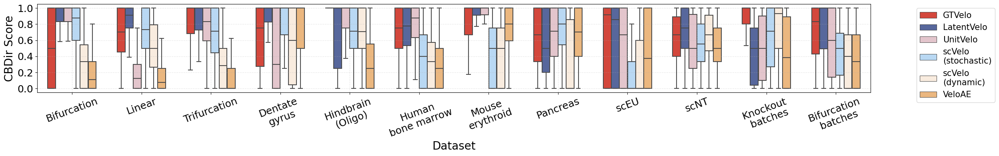

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# 读取数据
data = pd.read_excel(r'D:\code\mine\GTvelo2\HSS\单模态_scores.xlsx')

# 数据集名称映射（用于美化x轴标签）
dataset_name_map = {
    'bri': 'Bifurcation',
    'lin': 'Linear',
    'tri': 'Trifurcation',
    'den': 'Dentate\ngyrus',
    'hind': 'Hindbrain\n(Oligo)',
    'bone': 'Human\nbone marrow',
    'mouse': 'Mouse\nerythroid',
    'pan': 'Pancreas',
    'sceu': 'scEU',
    'scnt': 'scNT',
    'konbatch': 'Knockout\n batches',
    'bri2batch': 'Bifurcation\n batches'
}

# 模型名称映射（按指定顺序）
model_name_map = {
    'gt': 'GTVelo',
    'la': 'LatentVelo', 
    'un': 'UnitVelo',
    'scs': 'scVelo\n(stochastic)',
    'scd': 'scVelo\n(dynamic)', 
    'ae': 'VeloAE',
    
}

# 颜色方案（按指定顺序）
colors = {
    'GTVelo': '#EC3123',       # 深灰黑
    'LatentVelo': '#4b61a8',  
    'UnitVelo': '#e8c0c9',      # 浅粉
    'scVelo\n(shastic)': '#AFD9FD',  # 深蓝
    'scVelo\n(dynamic)': '#FEECDA',    # 深红
    'VeloAE': '#FDB76D',        # 珊瑚红
    # 浅蓝
}

# 重组数据
melted_data = data.melt()
melted_data[['model', 'dataset']] = melted_data['variable'].str.split('_', expand=True)

# 替换模型和数据集名称
melted_data['model_name'] = melted_data['model'].map(model_name_map)
melted_data['dataset_name'] = melted_data['dataset'].map(dataset_name_map)

# 定义模型顺序
model_order = ['GTVelo', 'LatentVelo', 'UnitVelo', 'scVelo\n(shastic)', 'scVelo\n(dynamic)', 'VeloAE']

# 设置图形样式和大小
plt.figure(figsize=(25, 4))
plt.style.use('default')

# 设置白色背景
plt.gca().set_facecolor('white')
plt.gcf().set_facecolor('white')

# 绘制箱线图，移除异常值点，并按指定顺序排列
bp = sns.boxplot(x='dataset_name', y='value', hue='model_name', data=melted_data,
                 palette=colors, width=0.7, 
                 order=list(dataset_name_map.values()),
                 hue_order=model_order,
                 showfliers=False)  # 移除异常值点

# 设置标签和刻度
plt.xlabel('Dataset', fontsize=20)
plt.ylabel('CBDir Score', fontsize=20)
plt.xticks(rotation=20, ha='center', fontsize=18)
plt.yticks(fontsize=18)

# 调整图例
handles, labels = plt.gca().get_legend_handles_labels()

plt.legend(handles, labels, #title='', 
           bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=15, title_fontsize=15)

# 添加网格线
plt.grid(True, linestyle='--', alpha=0.3)

# 调整布局
plt.tight_layout()

# 保存图像（取消注释以保存）
plt.savefig('D:/重要文件/小论文/图片/fig1/单模态CBDIR箱线图.png', dpi=300, bbox_inches='tight')

# 显示图形
plt.show()

In [ ]:
import numpy as np
from scipy.stats import pearsonr, spearmanr
import pandas as pd
from tqdm import tqdm
import scvelo as scv
import scanpy as sc
import latentvelo as ltv

def get_cluster_key(dataset_name):
    """根据数据集名称返回对应的聚类键"""
    cluster_keys = {
        'bri': 'milestone',
        'lin': 'milestone',
        'tri': 'milestone',
        'den': 'clusters',
        'hind': 'annotation',
        'bon': 'clusters',
        'mouse': 'celltype',
        'pan': 'clusters',
        'sceu': 'clusters',
        'scnt': 'time'
    }
    # Extract the dataset type from combined name (e.g., 'ae_bri' -> 'bri')
    dataset_type = dataset_name.split('_')[1]
    return cluster_keys[dataset_type]

def run_coherence_analysis():
    # 创建结果DataFrame
    results_df = pd.DataFrame()
    
    # 收集所有数据集
    datasets = {
        # # VeloAE datasets
        'ae_bri': ae_bri_adata,
        'ae_lin': ae_lin_adata,
        'ae_tri': ae_tri_adata,
        'ae_den': ae_den_adata,
        'ae_hind': ae_hind_adata,
        'ae_bon': ae_bon_adata,
        'ae_mouse': ae_mouse_adata,
        'ae_pan': ae_pan_adata,
        'ae_sceu': ae_sceu_adata,
        'ae_scnt': ae_scnt_adata,
        
        # # LatentVelo datasets
        'la_bri': la_bri_adata,
        'la_lin': la_lin_adata,
        'la_tri': la_tri_adata,
        'la_den': la_den_adata,
        'la_hind': la_hind_adata,
        'la_bon': la_bon_adata,
        'la_mouse': la_mouse_adata,
        'la_pan': la_pan_adata,
        'la_sceu': la_sceu_adata,
        'la_scnt': la_scnt_adata,
        
        # scVelo datasets
        'sc_bri': sc_bri_adata,
        'sc_lin': sc_lin_adata,
        'sc_tri': sc_tri_adata,
        'sc_den': sc_den_adata,
        'sc_hind': sc_hind_adata,
        'sc_bone': sc_bone_adata,
        'sc_mouse': sc_mouse_adata,
        'sc_pan': sc_pan_adata,
        'sc_sceu': sc_sceu_adata,
        'sc_scnt': sc_scnt_adata,
        
    #     # GTVelo datasets
        'gt_bri': gt_bri_adata,
        'gt_lin': gt_lin_adata,
        'gt_tri': gt_tri_adata,
        'gt_den': gt_den_adata,
        'gt_hind': gt_hind_adata,
        'gt_bone': gt_bone_adata,
        'gt_mouse': gt_mouse_adata,
        'gt_pan': gt_pan_adata,
        'gt_sceu': gt_sceu_adata,
        'gt_scnt': gt_scnt_adata,
        
    #     # GTVelo latent datasets
        'uni_bri': uni_bri_adata,
        'uni_lin':uni_lin_adata,
        'uni_tri': uni_tri_adata,
        'uni_den': uni_den_adata,
        'uni_hind':uni_hind_adata,
        'uni_bone': uni_bone_adata,
        'uni_mouse': uni_mouse_adata,
        'uni_pan': uni_pan_adata,
        'uni_sceu': uni_sceu_adata,
        'uni_scnt': uni_scnt_adata,
        }
    
    # 定义每个模型的velocity key
    velocity_keys = {
       'ae': 'new_velocity',
        'la': 'spliced_velocity',
        'sc': 'stovelo',  # Assuming standard scVelo key
        'gt': 'spliced_velocity',
        'uni': 'velocity'
    }
    
    # 设置进度条
    with tqdm(total=len(datasets), desc="Processing datasets") as pbar:
        # 处理每个数据集
        for dataset_name, adata in datasets.items():
            try:
                # 获取模型类型（ae, la, sc, gt, gt_latent）
                model_type = dataset_name.split('_')[0]
 
                
                # 获取velocity key
                velo_key = velocity_keys[model_type]
                
                # 获取cluster key
                cluster_key = get_cluster_key(dataset_name)
                
                # 计算coherence
                _, score = ltv.ev.inner_cluster_coh2(adata, cluster_key, velo_key)
                results_df.loc[dataset_name, 'score'] = score
                
                # 每处理完一个数据集就保存中间结果
                results_df.to_excel('iccoh.xlsx')
                
            except Exception as e:
                print(f"\nError processing {dataset_name}: {str(e)}")
                results_df.loc[dataset_name, 'score'] = None
                results_df.loc[dataset_name, 'error'] = str(e)
                continue
            finally:
                pbar.update(1)
    
    # 保存最终结果
    results_df.to_excel('iccoh_final2.xlsx')
    print("\nAnalysis complete! Results saved to 'cluster_coherence_results_final.xlsx'")
    return results_df

# 运行分析
if __name__ == "__main__":
    try:
        results = run_coherence_analysis()
    except Exception as e:
        print(f"An error occurred in the main execution: {str(e)}")

Processing datasets:  50%|█████     | 25/50 [00:07<00:20,  1.19it/s]


Error processing sc_bone: 'bone'


Processing datasets:  74%|███████▍  | 37/50 [00:11<00:03,  4.33it/s]


Error processing gt_bone: 'bone'


Processing datasets:  90%|█████████ | 45/50 [00:12<00:00,  6.37it/s]


Error processing uni_bone: 'bone'


Processing datasets: 100%|██████████| 50/50 [00:13<00:00,  3.70it/s]


Analysis complete! Results saved to 'cluster_coherence_results_final.xlsx'


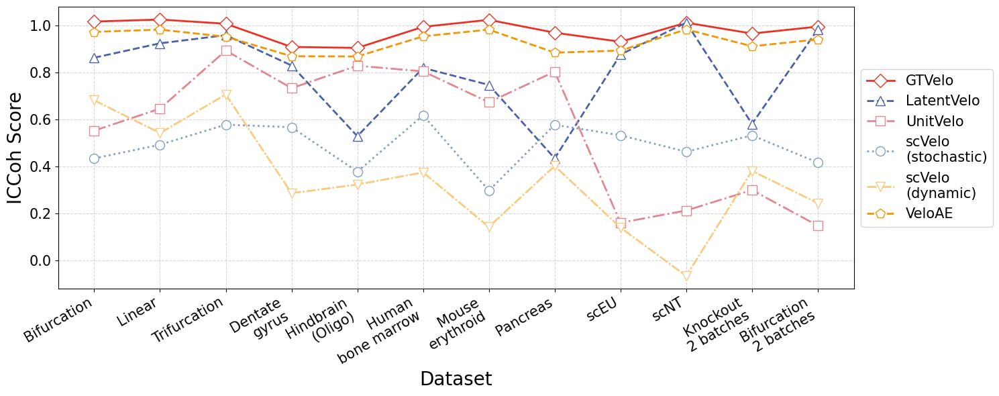

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

# 数据准备
names = [
    # VeloAE
    'VeloAE_Bifurcation', 'VeloAE_Linear', 'VeloAE_Trifurcation', 'VeloAE_Dentate_gyrus', 
    'VeloAE_Hindbrain_Oligo', 'VeloAE_Human_bone_marrow', 'VeloAE_Mouse_erythroid', 
    'VeloAE_Pancreas', 'VeloAE_scEU', 'VeloAE_scNT', 'VeloAE_knockout_2batches', 
    'VeloAE_Bifurcation_2batches',
    
    # LatentVelo
    'LatentVelo_Bifurcation', 'LatentVelo_Linear', 'LatentVelo_Trifurcation', 
    'LatentVelo_Dentate_gyrus', 'LatentVelo_Hindbrain_Oligo', 'LatentVelo_Human_bone_marrow', 
    'LatentVelo_Mouse_erythroid', 'LatentVelo_Pancreas', 'LatentVelo_scEU', 'LatentVelo_scNT', 
    'LatentVelo_knockout_2batches', 'LatentVelo_Bifurcation_2batches',
    # scVelo (shastic)
    'scVelos_Bifurcation', 'scVelos_Linear', 'scVelos_Trifurcation', 
    'scVelos_Dentate_gyrus', 'scVelos_Hindbrain_Oligo', 'scVelos_Human_bone_marrow', 
    'scVelos_Mouse_erythroid', 'scVelos_Pancreas', 'scVelos_scEU', 'scVelos_scNT', 
    'scVelos_knockout_2batches', 'scVelos_Bifurcation_2batches',
    #dyn
    'scVelod_Bifurcation', 'scVelod_Linear', 'scVelod_Trifurcation', 
    'scVelod_Dentate_gyrus', 'scVelod_Hindbrain_Oligo', 'scVelod_Human_bone_marrow', 
    'scVelod_Mouse_erythroid', 'scVelod_Pancreas', 'scVelod_scEU', 'scVelod_scNT', 
    'scVelod_knockout_2batches', 'scVelod_Bifurcation_2batches',
    
    
    
    # GTVelo
    'GTVelo_Bifurcation', 'GTVelo_Linear', 'GTVelo_Trifurcation', 'GTVelo_Dentate_gyrus', 
    'GTVelo_Hindbrain_Oligo', 'GTVelo_Human_bone_marrow', 'GTVelo_Mouse_erythroid', 
    'GTVelo_Pancreas', 'GTVelo_scEU', 'GTVelo_scNT', 'GTVelo_knockout_2batches', 
    'GTVelo_Bifurcation_2batches',
    
    # UnitVelo
    'UnitVelo_Bifurcation', 'UnitVelo_Linear', 'UnitVelo_Trifurcation', 'UnitVelo_Dentate_gyrus', 
    'UnitVelo_Hindbrain_Oligo', 'UnitVelo_Human_bone_marrow', 'UnitVelo_Mouse_erythroid', 
    'UnitVelo_Pancreas', 'UnitVelo_scEU', 'UnitVelo_scNT', 'UnitVelo_knockout_2batches', 
    'UnitVelo_Bifurcation_2batches',
]

scores = [
    0.973564923, 0.983165503, 0.952948093, 0.869994164, 0.868962884, 0.954696774, 0.983371258, 
    0.885222316, 0.894050956, 0.984183788, 0.9125245, 0.9415308,
    
    0.863771737, 0.924942791, 0.959625721, 0.830713272, 0.529853046, 0.820373178, 0.747919858, 
    0.435297877, 0.877137482, 1.01284337, 0.582168, 0.9843812,
    
    0.435190201, 0.493492216, 0.578752518, 0.56793648, 0.378756046, 0.61837584, 0.298149019, 
    0.578260958, 0.533610523, 0.463592947, 0.5331789, 0.4176373,
0.682322217,
0.543097976,
0.707118639,
0.287118782,
0.32389022,
0.375561162,
0.143797252,
0.403099241,
0.140846794,
-0.065404958,
0.382148437,
0.244894531,

    1.017550588, 1.026150823, 1.008224487, 0.909427226, 0.90551728, 0.9950119, 1.024926305, 
    0.970166802, 0.931706369, 1.012845039, 0.9665464, 0.99600077,
    
    0.553334296, 0.646946907, 0.894205809, 0.734057009, 0.829582036, 0.8056153, 0.67411345, 
    0.80445528, 0.161354676, 0.213457182, 0.3003996, 0.14906256
]
# 修改模型名称映射
model_name_map = {
    'VeloAE': 'VeloAE',
    'LatentVelo': 'LatentVelo', 
    'GTVelo': 'GTVelo',
    'UnitVelo': 'UnitVelo',
    'scVelos': 'scVelo\n(stochastic)',
    'scVelod': 'scVelo\n(dynamic)'
}

# 创建映射字典以处理不同的模型简称
def custom_model_split(name):
    for prefix, model_name in model_name_map.items():
        if name.startswith(prefix):
            return model_name, name.replace(prefix+'_', '')
    return name.split('_', 1)

# 使用自定义拆分方法
df[['模型', '数据集']] = df['名称'].apply(custom_model_split).tolist()


# 定义颜色和样式
colors = {
    'GTVelo': '#EC3123',       # 红色
    'LatentVelo': '#4b61a8',   # 深蓝色
    'UnitVelo': '#E18791',     # 浅粉色
    'scVelo\n(stochastic)': '#83A0BE',  # 浅蓝色
    'scVelo\n(dynamic)': '#F9CB80', #FDB76D    # 浅黄色
    'VeloAE': '#F49600',       # 橙色
}
 
# 数据集映射（如果需要更友好的显示）
dataset_map = {
    'Bifurcation': 'Bifurcation',
    'Linear': 'Linear',
    'Trifurcation': 'Trifurcation', 
    'Dentate_gyrus': 'Dentate\ngyrus',
    'Hindbrain_Oligo': 'Hindbrain\n(Oligo)',
    'Human_bone_marrow': 'Human\nbone marrow',
    'Mouse_erythroid': 'Mouse\nerythroid',
    'Pancreas': 'Pancreas',
    'scEU': 'scEU',
    'scNT': 'scNT',
    'knockout_2batches': 'Knockout\n2 batches',
    'Bifurcation_2batches': 'Bifurcation\n2 batches'
}
 
model_order = ['GTVelo', 'LatentVelo', 'UnitVelo', 'scVelo\n(stochastic)', 'scVelo\n(dynamic)', 'VeloAE']
# 选择要显示的模型
#models = ['GTVelo', 'LatentVelo', 'VeloAE',]

# 初始化画布
plt.figure(figsize=(15, 6))

# 定义线条样式和标记
markers = ['D', '^', 's', 'o', 'v', 'p']
linestyles = ['-', '--', '-.', ':', (0, (5, 1, 1, 1)), '--']

# 遍历每个模型绘制折线图
for i, model in enumerate(model_order):
    # 按原始顺序聚合数据
    model_data = df[df['模型'] == model].copy()
    
    # 使用映射转换数据集名称
    model_data['数据集'] = model_data['数据集'].map(dataset_map)
    
    plt.plot(
        model_data['数据集'], 
        model_data['score'], 
        linestyle=linestyles[i], 
        marker=markers[i], 
        color=colors[model], 
        linewidth=2,  
        markersize=10,  
        markerfacecolor='white',  
        markeredgecolor=colors[model],  
        label=model
    )

# 添加图表信息
plt.xticks(rotation=30, ha='right', fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel("Dataset", fontsize=20)
plt.ylabel("ICCoh Score", fontsize=20)

# 添加图例
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=15)
# 添加网格
plt.grid(True, linestyle='--', alpha=0.5)

# 调整布局
plt.tight_layout()
plt.savefig(f'D:/重要文件/小论文/图片/fig2/单模态ICCOH.png', dpi=600) 
# 显示图表
plt.show()

# 显示图表
 